### Data Section:
 The data set we used is a subset of the Electricity Consumption and Occupancy (ECO) data set. Data from three households are provided, comprising power consumption overall (from smart meters) and particular plugs/appliances per second over a period of time. For the smart meter data, the primary interest is the variable powerallphases which is the sum of real power over all power phases consumed in the household. The plugs data provides appliance-level consumption. The measurement period is from 27.06.2012 to 31.01.2013. For smart meter data set, Each CVS file contains aggregate consumption data of a single day and is named accordingly (e.g., "2012-08-31.csv"). Each file contains 86,400 rows (i.e., one row for each second). For plug data set, Each file contains plug measurements for the whole household. The (daily) data for each plug is stored in subfolders named after the plug ID (e.g., "05") described above.

### Data-science questions:
What is the average power consumption of the three households among one single day and what's the difference power consumption pattern among these three households?
 

### Data preparation and EDA:

In [12]:
import os
import glob
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
import plotly.io as pio
import altair as alt
from altair import *

In [8]:
## 1. Read in the data
path = os.getcwd() 
csv_files = glob.glob(os.path.join(path, "*.csv"))

In [9]:
## merge all csv files into one
merged_data = pd.DataFrame()

for file in csv_files:
    data = pd.read_csv(file)
    new_data = data.iloc[:,0:1]
    merged_data = pd.concat([merged_data, new_data],axis=1)

merged_data.to_csv("merged_data04.csv", index=False)   

In [2]:
merged_data04 = pd.read_csv("merged_data04.csv",header=None)
merged_data04.head()

,0,1,2,3,4,5,6,7,8,9,...,210,211,212,213,214,215,216,217,218,219
0,475.051,471.613,388.260,322.296,669.534,273.527,506.190,342.716,479.770,357.796,...,508.929,265.679,344.662,835.836,744.692,249.665,143.567,168.524,252.644,0.000
1,473.888,471.241,388.242,321.624,669.885,273.683,505.193,342.357,468.464,357.008,...,509.204,267.317,343.996,835.663,755.892,249.868,143.737,168.004,253.131,473.888
2,479.664,474.627,388.588,320.595,669.751,275.302,506.366,343.306,474.206,357.715,...,509.830,271.529,344.705,835.620,761.503,250.146,303.008,168.066,253.910,471.241
3,473.089,470.901,387.713,320.068,669.951,275.847,506.894,343.274,480.278,358.178,...,510.762,271.287,344.832,836.544,753.332,249.367,303.254,169.034,252.444,388.242
4,476.251,467.155,387.661,320.023,669.545,275.213,506.311,343.932,473.231,357.575,...,509.495,264.640,344.303,834.703,741.218,249.588,956.199,168.382,252.733,321.624


In [2]:
## 1. Read in the data
path = os.getcwd() 
csv_files = glob.glob(os.path.join(path, "*.csv"))

In [3]:
## merge all csv files into one
merged_data = pd.DataFrame()

for file in csv_files:
    data = pd.read_csv(file)
    new_data = data.iloc[:,0:1]
    merged_data = pd.concat([merged_data, new_data],axis=1)

merged_data.to_csv("merged_data05.csv", index=False)   

In [3]:
merged_data05 = pd.read_csv("merged_data05.csv",header=None)
merged_data05.head()

,0,1,2,3,4,5,6,7,8,9,...,206,207,208,209,210,211,212,213,214,215
0,6273.09,254.375,241.747,380.125,168.119,165.735,153.432,276.115,355.912,156.068,...,6296.01,6261.38,6277.54,6344.61,6521.11,6203.82,6344.42,257.285,6345.62,0.000
1,6274.78,254.920,241.362,380.339,168.348,166.020,153.122,276.753,355.695,156.534,...,6301.06,6257.22,6278.27,6345.30,6526.10,6207.06,6339.01,257.248,6338.18,6274.780
2,6275.62,254.202,241.595,380.587,169.624,166.030,152.875,277.101,355.217,157.168,...,6302.55,6258.90,6279.06,6334.77,6521.29,6203.81,6346.27,257.667,6347.81,254.920
3,6275.39,253.736,241.161,380.920,168.647,165.715,153.483,276.296,353.996,156.868,...,6299.15,6263.78,6277.52,6334.92,6523.40,6197.61,6342.02,258.168,6346.59,241.362
4,6276.77,254.227,241.528,379.710,168.248,165.439,153.289,275.873,354.267,156.011,...,6299.45,6264.73,6278.89,6344.52,6521.95,6204.45,6342.84,257.311,6343.05,380.339


In [3]:
## 1. Read in the data
path = os.getcwd() 
csv_files = glob.glob(os.path.join(path, "*.csv"))

In [4]:
## merge all csv files into one
merged_data = pd.DataFrame()

for file in csv_files:
    data = pd.read_csv(file)
    new_data = data.iloc[:,0:1]
    merged_data = pd.concat([merged_data, new_data],axis=1)

merged_data.to_csv("merged_data06.csv", index=False)  

In [4]:
merged_data06 = pd.read_csv("merged_data06.csv",header=None)
merged_data06.head()

,0,1,2,3,4,5,6,7,8,9,...,157,158,159,160,161,162,163,164,165,166
0,80.707,78.025,118.941,121.508,307.051,80.798,131.802,130.719,119.885,181.217,...,75.492,125.325,75.271,90.201,1143.680,119.409,71.763,72.156,72.176,0.000
1,81.846,77.913,118.743,122.661,306.511,80.242,131.935,130.878,119.745,179.806,...,76.858,127.070,74.784,90.332,857.843,119.197,71.977,72.034,72.729,81.846
2,80.249,77.585,118.777,121.579,306.754,80.968,131.304,130.989,120.642,179.567,...,75.887,126.146,74.991,90.438,447.339,119.938,72.418,72.165,72.339,77.913
3,80.419,77.959,118.909,121.009,308.230,80.590,131.658,131.071,119.536,179.166,...,75.656,126.140,75.558,90.500,451.519,119.176,72.972,73.100,72.100,118.743
4,80.651,78.242,118.887,120.551,305.649,80.711,132.185,130.266,119.552,178.640,...,75.600,125.749,75.556,90.788,451.769,120.854,72.074,72.515,72.465,122.661


In [25]:
dates = pd.date_range('2012-06-27', periods=220, freq='D')
merged_data04 = merged_data04.rename(columns=dict(zip(merged_data04.columns, dates)))
merged_data05 = merged_data05.rename(columns=dict(zip(merged_data05.columns, dates)))
merged_data06 = merged_data06.rename(columns=dict(zip(merged_data06.columns, dates)))

print(merged_data04.describe())
print(merged_data05.describe())
print(merged_data06.describe())


         2012-06-27    2012-06-28    2012-06-29    2012-06-30    2012-07-01  \
count  86400.000000  86400.000000  86400.000000  86400.000000  86400.000000   
mean     802.925567    662.805459    678.477467    656.524245    742.376459   
std     1247.708502    972.459016    947.606852    885.165614   1251.727705   
min      170.147000    173.207000    170.052000    259.303000     -1.000000   
25%      354.412750    340.016000    335.668000    359.070000    353.299000   
50%      438.730000    389.596000    365.150500    429.129500    385.725000   
75%      556.643000    480.479250    479.894250    516.405000    494.793750   
max     7557.000000   5580.580000   5536.560000   5577.690000   7908.960000   

         2012-07-02    2012-07-03    2012-07-04    2012-07-05    2012-07-06  \
count  86400.000000  86400.000000  86400.000000  86400.000000  86400.000000   
mean     688.164971    779.783234    642.688488    604.420900    655.393747   
std      899.321735    971.889526    959.079528    

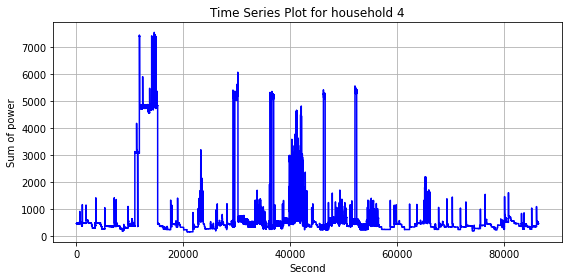

In [13]:
fig = plt.figure(figsize=(8, 4))
ax = fig.add_subplot(1,1,1)
ax.plot(merged_data04.index, merged_data04.iloc[:,0], color='blue', linestyle='-')
ax.set_xlabel('Second')
ax.set_ylabel('Sum of power')
ax.set_title('Time Series Plot for household 4')
plt.tight_layout()
plt.grid(True)
plt.show()

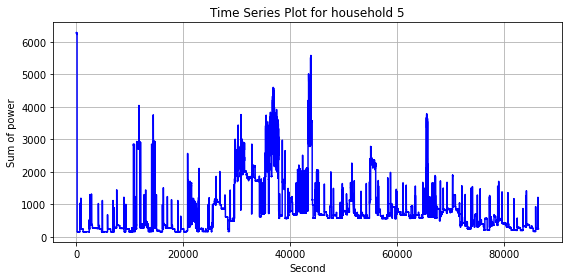

In [16]:
fig = plt.figure(figsize=(8, 4))
ax = fig.add_subplot(1,1,1)
ax.plot(merged_data05.index, merged_data05.iloc[:,0], color='blue', linestyle='-')
ax.set_xlabel('Second')
ax.set_ylabel('Sum of power')
ax.set_title('Time Series Plot for household 5')
plt.tight_layout()
plt.grid(True)
plt.show()

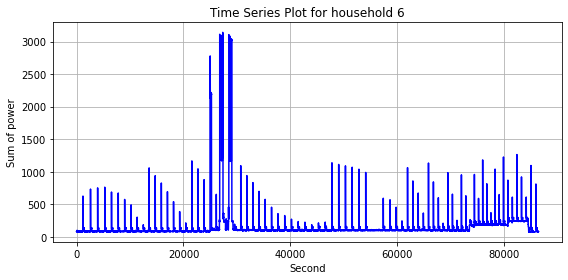

In [17]:
fig = plt.figure(figsize=(8, 4))
ax = fig.add_subplot(1,1,1)
ax.plot(merged_data06.index, merged_data06.iloc[:,0], color='blue', linestyle='-')
ax.set_xlabel('Second')
ax.set_ylabel('Sum of power')
ax.set_title('Time Series Plot for household 6')
plt.tight_layout()
plt.grid(True)
plt.show()

### Results section:
After EDA part, I will use both Plotly and Altair to show interaction between 3 households and their power consumption. I will also use Plotly and Altair to show the difference power consumption pattern among these three households.

In [69]:
# Plotly
# TRACE-1: household 4 daily average power consumption
fig = go.Figure()
fig.add_trace(
    go.Scatter(
        x=merged_data04.index, 
        y=merged_data04.mean(axis=1), 
        mode="markers",
        marker=dict(
            color=merged_data04.mean(axis=1),
            showscale=True,
            colorscale="Viridis",
            symbol="circle",
        ),
    opacity=1.0,
    visible=True,  
    )
)

# TRACE-2: household 5 daily average power consumption
fig.add_trace(
    go.Scatter(
        x=merged_data05.index, 
        y=merged_data05.mean(axis=1), 
        mode="markers",
        marker=dict(
            color=merged_data05.mean(axis=1),
            showscale=True,
            colorscale="Viridis",
            symbol="circle",
        ),
    opacity=1.0,
    visible=True,  
    )
)

# TRACE-3: household 6 daily average power consumption
fig.add_trace(
    go.Scatter(
        x=merged_data06.index, 
        y=merged_data06.mean(axis=1), 
        mode="markers",
        marker=dict(
            color=merged_data06.mean(axis=1),
            showscale=True,
            colorscale="Viridis",
            symbol="circle",
        ),
        opacity=1.0,
        visible=True,  
    )
)

# SET THEME, AXIS LABELS, AND LOG SCALE
fig.update_layout(
    template="plotly_white",
    xaxis_title="Second",
    yaxis_title="Daily average power consumption",
    title="Compariosn of daily average power consumption of 3 households",
)


# VARIABLES FOR BUTTON LOCATION
# (SET THESE BY TRIAL AND ERROR) 
button_height = 0.15
x1_loc = 0.00
y1_loc = 1.15

# DROPDOWN MENUS
fig.update_layout(
    # DEFINE A LIST OF THE VARIOUS BUTTONS (STORED AS DICTIONARIES)
    updatemenus=[
        # BUTTON-1: OPACITY
        dict(
            buttons=[
                dict(
                    label="household 4 daily average power consumption",            # LABEL SHOWN TO USER
                    method="update",                    # MODIFICATION TYPE (SEE ABOVE)
                     args=[{"visible": [True, False, False]}]  # BOOLEAN VALUES FOR EACH TRACE
                        
                     ),
                dict(
                    label="household 5 daily average power consumption",            # LABEL SHOWN TO USER
                    method="update",                    # MODIFICATION TYPE (SEE ABOVE)
                     args=[{"visible": [False, True, False]}]  # BOOLEAN VALUES FOR EACH TRACE
                        
                     ),     
                dict(
                    label="household 6 daily average power consumption",            # LABEL SHOWN TO USER
                    method="update",                    # MODIFICATION TYPE (SEE ABOVE)
                     args=[{"visible": [False, False, True]}]  # BOOLEAN VALUES FOR EACH TRACE
                        
                     ),            
            ],
            # PLACEMENT AND META DATA FOR THE BUTTON
            direction="down",
            showactive=True,  # HIGHLIGHTS ACTIVE DROPDOWN ITEM OR ACTIVE BUTTON IF TRUE
            pad={"r": 10, "t": 10},  # PADDING
            x=x1_loc,  # POSITION
            y=y1_loc,
            xanchor="left",  # ANCHOR POINT
            yanchor="top",
        )
    ]
)


fig

In [64]:
# Altair
merged_data004 = merged_data04.reset_index().rename(columns={'index': 'second'})
melted_data4 = pd.melt(merged_data004, id_vars=['second'], value_vars=merged_data004.columns[1:], var_name='date', value_name='power')
melted_data4 = melted_data4.assign(household=4)
merged_data005 = merged_data05.reset_index().rename(columns={'index': 'second'})
melted_data5 = pd.melt(merged_data005, id_vars=['second'], value_vars=merged_data005.columns[1:], var_name='date', value_name='power')
melted_data5 = melted_data5.assign(household=5)
merged_data006 = merged_data06.reset_index().rename(columns={'index': 'second'})
melted_data6 = pd.melt(merged_data006, id_vars=['second'], value_vars=merged_data006.columns[1:], var_name='date', value_name='power')
melted_data6 = melted_data6.assign(household=6)
merged_data0 = melted_data4.append(melted_data5)
merged_data0 = merged_data0.append(melted_data6)
grouped_data = merged_data0.groupby(['second', 'household']).mean()
grouped_data = pd.DataFrame(grouped_data.to_records())
grouped_data 

,second,household,power
0,0,4,525.170027
1,0,5,3078.247347
2,0,6,156.096479
3,1,4,529.918264
4,1,5,3106.836704
...,...,...,...
259195,86398,5,3093.899767
259196,86398,6,159.547386
259197,86399,4,523.527922
259198,86399,5,3092.486335


In [67]:
# draw a Altair chart for the merged data
alt.Chart(top).mark_line().encode(
    x='second',
    y='power',
    color='household'
).properties(
    width=600,
    height=300
)

alt.Chart(...)